In [1]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
# Paths to simulation results
base_path = "../simulation_results_MalwareInfection"
models = ["D2D_RWP", "D2D_GAM"]

We have 10 runs for each model with different seed

In [3]:
num_runs = 10  # Total runs per model

In [4]:
# Function to load infection data for all runs
def load_multiple_runs(model):
    infection_data = []
    
    for run in range(1, num_runs + 1):
        file_path = f"{base_path}/{model}/run_{run}_reports/infection_log.json"
        
        if os.path.exists(file_path):
            with open(file_path, "r") as f:
                data = json.load(f)
                for entry in data:
                    entry["run"] = run  # Track which run this data is from
                    entry["model"] = model  # Label the model
                infection_data.extend(data)
        else:
            print(f"Warning: {file_path} not found!")
    
    return pd.DataFrame(infection_data)

# Load data for both models
df_D2D_RWP = load_multiple_runs("D2D_RWP")
df_D2D_GAM = load_multiple_runs("D2D_GAM")

# Combine data
df = pd.concat([df_D2D_RWP, df_D2D_GAM], ignore_index=True)

# Check data structure
df.head()

,infected_by,infection_status,malware_active_time,node_postion_at_active_infected,node_id,run,model
0,3,Infected Active,139.0,"(1467.19,1034.84)",77,1,D2D_RWP
1,4,Infected Active,139.0,"(477.77,1047.87)",12,1,D2D_RWP
2,4,Infected Active,169.0,"(670.36,916.61)",22,1,D2D_RWP
3,0,Infected Active,199.0,"(1480.39,860.83)",88,1,D2D_RWP
4,1,Infected Active,259.0,"(829.14,924.00)",63,1,D2D_RWP


Get fastest, slowest and median run using the last infected node infection timestamp

In [5]:
# Compute the final infection timestamp for each run
final_infection_times = df.groupby(["model", "run"])["malware_active_time"].max().reset_index()

# Initialize lists to store results
fastest_runs_list = []
slowest_runs_list = []
median_runs_list = []

# Process each model separately
for model in final_infection_times["model"].unique():
    model_data = final_infection_times[final_infection_times["model"] == model]

    # Fastest run (smallest final infection timestamp)
    fastest_run = model_data.loc[model_data["malware_active_time"].idxmin()]
    fastest_runs_list.append(fastest_run)

    # Slowest run (largest final infection timestamp)
    slowest_run = model_data.loc[model_data["malware_active_time"].idxmax()]
    slowest_runs_list.append(slowest_run)

    # Median run (closest to median final infection time)
    median_value = model_data["malware_active_time"].median()
    closest_median_run = model_data.iloc[(model_data["malware_active_time"] - median_value).abs().argsort().iloc[0]]
    median_runs_list.append(closest_median_run)

# Convert lists to DataFrames and reset index
fastest_runs = pd.DataFrame(fastest_runs_list).reset_index(drop=True)
slowest_runs = pd.DataFrame(slowest_runs_list).reset_index(drop=True)
median_runs = pd.DataFrame(median_runs_list).reset_index(drop=True)

# Compute total infected nodes for each selected run
def get_total_infected(run_info):
    model, run = run_info["model"], run_info["run"]
    return df[(df["model"] == model) & (df["run"] == run)]["node_id"].nunique()

# Apply function to each selected run
fastest_runs["total_infected"] = fastest_runs.apply(get_total_infected, axis=1)
slowest_runs["total_infected"] = slowest_runs.apply(get_total_infected, axis=1)
median_runs["total_infected"] = median_runs.apply(get_total_infected, axis=1)

# Print results
print("Fastest Runs:\n", fastest_runs)
print("\nSlowest Runs:\n", slowest_runs)
print("\nMedian Runs:\n", median_runs)


Fastest Runs:
      model  run  malware_active_time  total_infected
0  D2D_GAM    3               1669.0              95
1  D2D_RWP    4               1599.0              95

Slowest Runs:
      model  run  malware_active_time  total_infected
0  D2D_GAM    5               3349.0              93
1  D2D_RWP    5               2219.0              95

Median Runs:
      model  run  malware_active_time  total_infected
0  D2D_GAM    7               2799.0              95
1  D2D_RWP    3               1819.0              95


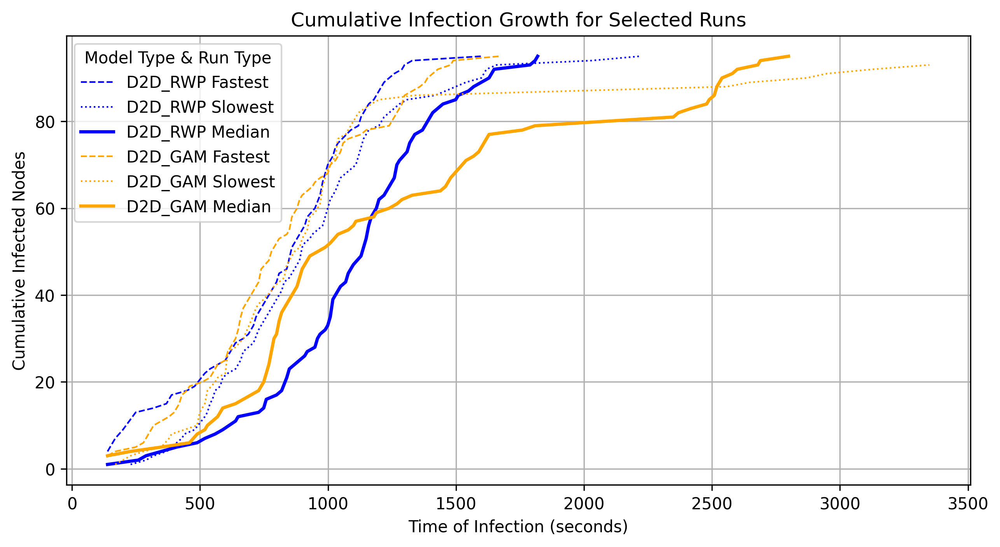

In [6]:
# Define colors for different infection trends
colors = {"D2D_RWP": "blue", "D2D_GAM": "orange"}
line_styles = {"Fastest": "dashed", "Slowest": "dotted", "Median": "solid"}

plt.figure(figsize=(10,5), dpi=300)

# Plot the three selected runs for each model
for model in df["model"].unique():
    model_df = df[df["model"] == model]

    # Get the run numbers for fastest, slowest, and median
    fastest_run_id = fastest_runs.loc[fastest_runs["model"] == model, "run"].values[0]
    slowest_run_id = slowest_runs.loc[slowest_runs["model"] == model, "run"].values[0]
    median_run_id = median_runs.loc[median_runs["model"] == model, "run"].values[0]

    # Extract infection data for the selected runs and compute cumulative infections
    """for run_id, run_type in zip([fastest_run_id, slowest_run_id, median_run_id], ["Fastest", "Slowest", "Median"]):
        run_df = model_df[model_df["run"] == run_id].groupby("malware_active_time")["node_id"].count().cumsum().reset_index()
        sns.lineplot(data=run_df, x="malware_active_time", y="node_id",
                     color=colors[model], linestyle=line_styles[run_type], linewidth=2 if run_type == "Median" else 1,
                     label=f"{model} {run_type}")"""
    # Extract infection data for the selected runs and compute cumulative infections
    for run_id, run_type in zip([fastest_run_id, slowest_run_id, median_run_id], ["Fastest", "Slowest", "Median"]):
        grouped = model_df[model_df["run"] == run_id].groupby("malware_active_time").size().cumsum()
        run_df = grouped.reset_index()
        run_df.columns = ["malware_active_time", "cumulative_infections"]
    
        plt.plot(
            run_df["malware_active_time"].to_numpy(),
            run_df["cumulative_infections"].to_numpy(),
            color=colors[model],
            linestyle=line_styles[run_type],
            linewidth=2 if run_type == "Median" else 1,
            label=f"{model} {run_type}"
        )
        
plt.xlabel("Time of Infection (seconds)")
plt.ylabel("Cumulative Infected Nodes")
plt.title("Cumulative Infection Growth for Selected Runs")
plt.legend(title="Model Type & Run Type")
plt.grid(True)
plt.savefig("Plots/Cumulative Infection Growth for Selected Runs.pdf", format="pdf", bbox_inches="tight")
plt.show()


In [7]:
# Get infection dataset for the median run of RWP
median_rwp_run_id = median_runs.loc[median_runs["model"] == "D2D_RWP", "run"].values[0]
df_infections_rwp = df[(df["model"] == "D2D_RWP") & (df["run"] == median_rwp_run_id)]

# Extract latitude & longitude from infection positions
df_infections_rwp[["latitude", "longitude"]] = df_infections_rwp["node_postion_at_active_infected"].str.extract(r"\((.*),(.*)\)").astype(float)

# Show first few rows
df_infections_rwp.head()

/tmp/ipykernel_1248249/4131002694.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_infections_rwp[["latitude", "longitude"]] = df_infections_rwp["node_postion_at_active_infected"].str.extract(r"\((.*),(.*)\)").astype(float)
/tmp/ipykernel_1248249/4131002694.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_infections_rwp[["latitude", "longitude"]] = df_infections_rwp["node_postion_at_active_infected"].str.extract(r"\((.*),(.*)\)").astype(float)


,infected_by,infection_status,malware_active_time,node_postion_at_active_infected,node_id,run,model,latitude,longitude
190,2,Infected Active,139.0,"(1023.48,1082.00)",9,3,D2D_RWP,1023.48,1082.00
191,2,Infected Active,259.0,"(1505.87,1091.83)",22,3,D2D_RWP,1505.87,1091.83
192,1,Infected Active,289.0,"(532.49,1668.77)",88,3,D2D_RWP,532.49,1668.77
193,0,Infected Active,349.0,"(1808.97,845.81)",20,3,D2D_RWP,1808.97,845.81
194,3,Infected Active,409.0,"(107.98,1203.65)",95,3,D2D_RWP,107.98,1203.65


In [8]:
# Get infection dataset for the median run of GAM
median_gam_run_id = median_runs.loc[median_runs["model"] == "D2D_GAM", "run"].values[0]
df_infections_gam = df[(df["model"] == "D2D_GAM") & (df["run"] == median_gam_run_id)]

# Extract latitude & longitude from infection positions
df_infections_gam[["latitude", "longitude"]] = df_infections_gam["node_postion_at_active_infected"].str.extract(r"\((.*),(.*)\)").astype(float)

# Show first few rows
df_infections_gam.head()


/tmp/ipykernel_1248249/3714729928.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_infections_gam[["latitude", "longitude"]] = df_infections_gam["node_postion_at_active_infected"].str.extract(r"\((.*),(.*)\)").astype(float)
/tmp/ipykernel_1248249/3714729928.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_infections_gam[["latitude", "longitude"]] = df_infections_gam["node_postion_at_active_infected"].str.extract(r"\((.*),(.*)\)").astype(float)


,infected_by,infection_status,malware_active_time,node_postion_at_active_infected,node_id,run,model,latitude,longitude
1515,4,Infected Active,139.0,"(2734.11,240.68)",6,7,D2D_GAM,2734.11,240.68
1516,1,Infected Active,139.0,"(802.50,1453.90)",94,7,D2D_GAM,802.50,1453.90
1517,0,Infected Active,139.0,"(457.28,387.61)",46,7,D2D_GAM,457.28,387.61
1518,4,Infected Active,229.0,"(2715.70,385.44)",87,7,D2D_GAM,2715.70,385.44
1519,2,Infected Active,349.0,"(1131.48,1495.71)",15,7,D2D_GAM,1131.48,1495.71


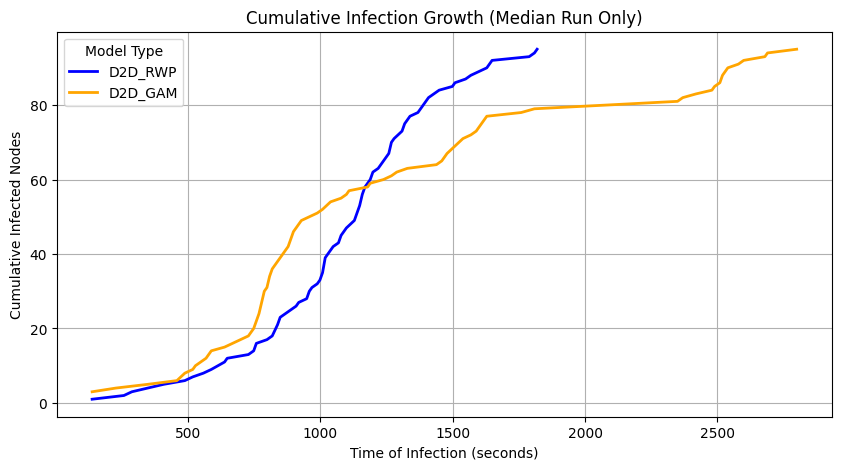

In [9]:
# Plot only median run

# Define colors for different infection trends
colors = {"D2D_RWP": "blue", "D2D_GAM": "orange"}

plt.figure(figsize=(10,5))

df = pd.concat([df_infections_rwp, df_infections_gam], ignore_index=True)

# Plot only the median infection growth for each model
for model in df["model"].unique():
    model_df = df[df["model"] == model]

    """# Get the run number for the median run
    median_run_id = median_runs.loc[median_runs["model"] == model, "run"].values[0]

    # Extract infection data for the median run and compute cumulative infections
    median_df = model_df[model_df["run"] == median_run_id].groupby("malware_active_time")["node_id"].count().cumsum().reset_index()

    # Plot median infection growth
    sns.lineplot(data=median_df, x="malware_active_time", y="node_id",
                 color=colors[model], linewidth=2, label=f"{model}")"""
    # Get the run number for the median run
    median_run_id = median_runs.loc[median_runs["model"] == model, "run"].values[0]

    # Group by infection time and compute cumulative infections
    grouped = model_df[model_df["run"] == median_run_id].groupby("malware_active_time").size().cumsum()
    median_df = grouped.reset_index()
    median_df.columns = ["malware_active_time", "cumulative_infections"]

    # Use plt.plot instead of seaborn
    plt.plot(
        median_df["malware_active_time"].to_numpy(),
        median_df["cumulative_infections"].to_numpy(),
        color=colors[model],
        linewidth=2,
        label=f"{model}"
    )

plt.xlabel("Time of Infection (seconds)")
plt.ylabel("Cumulative Infected Nodes")
plt.title("Cumulative Infection Growth (Median Run Only)")
plt.legend(title="Model Type")
plt.grid(True)
plt.show()


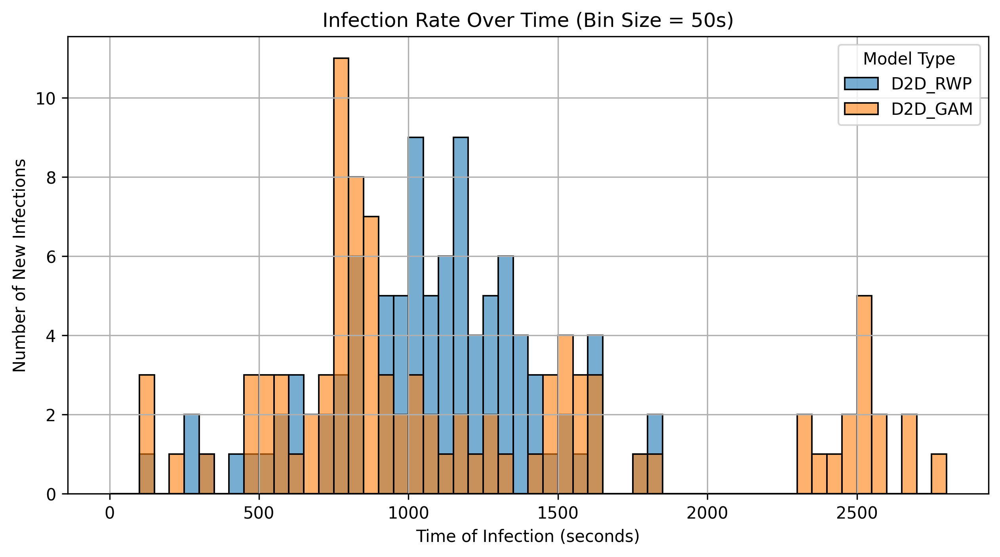

In [10]:
# Infection Rate Over Time (New Infections per Time Step) 

plt.figure(figsize=(10,5), dpi=300)

# Set bin size (adjust if needed)
bin_size = 50  # Time interval width in seconds

df = pd.concat([df_infections_rwp, df_infections_gam], ignore_index=True)

for model in df["model"].unique():
    model_df = df[df["model"] == model]

    # Histogram of new infections per time slot
    sns.histplot(model_df["malware_active_time"], bins=range(0, int(df["malware_active_time"].max()) + bin_size, bin_size),
                 kde=False, label=model, alpha=0.6)

plt.xlabel("Time of Infection (seconds)")
plt.ylabel("Number of New Infections")
plt.title(f"Infection Rate Over Time (Bin Size = {bin_size}s)")
plt.legend(title="Model Type")
plt.grid(True)
plt.savefig("Plots/Infection Rate Over Time.pdf", format="pdf", bbox_inches="tight")
plt.show()



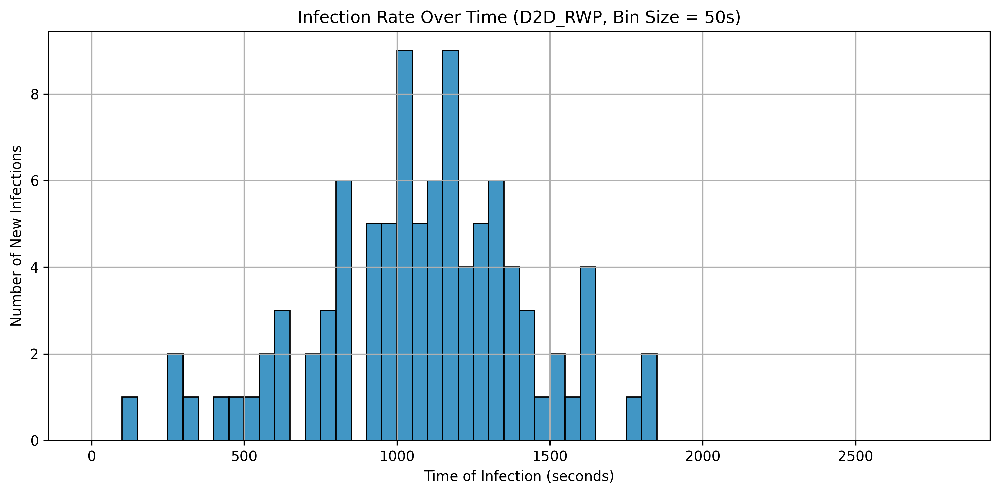

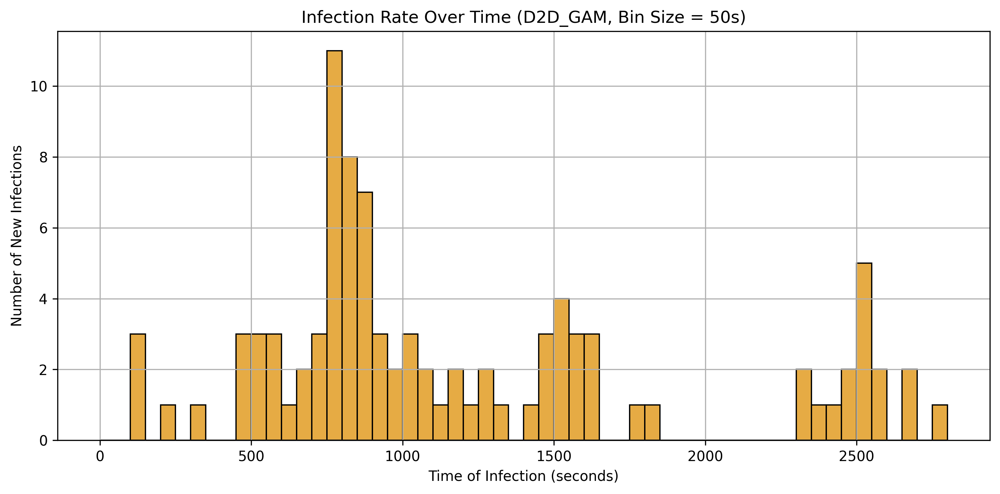

In [11]:
# Set bin size
bin_size = 50  # Time interval width in seconds

# Define custom colors for models
palette = sns.color_palette("colorblind")
colors = {
    "D2D_RWP": palette[0],
    "D2D_GAM": palette[1]
}

# Combine infection data
df = pd.concat([df_infections_rwp, df_infections_gam], ignore_index=True)

# Output folder
os.makedirs("Plots", exist_ok=True)

# Loop through each model
for model in df["model"].unique():
    model_df = df[df["model"] == model]

    plt.figure(figsize=(10,5), dpi=300)
    
    sns.histplot(
        model_df["malware_active_time"],
        bins=range(0, int(df["malware_active_time"].max()) + bin_size, bin_size),
        kde=False,
        color=colors[model],
        #alpha=0.6
    )

    plt.xlabel("Time of Infection (seconds)")
    plt.ylabel("Number of New Infections")
    plt.title(f"Infection Rate Over Time ({model}, Bin Size = {bin_size}s)")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"Plots/Infection_Rate_{model}.pdf", format="pdf", bbox_inches="tight")
    plt.show()

In [12]:
# Get the Mobility traces of the median run number for the RWP model

median_rwp_run_id = median_runs.loc[median_runs["model"] == "D2D_RWP", "run"].values[0]

# Path to the mobility traces for the median run
mobility_log_path = f"{base_path}/D2D_RWP/run_{median_rwp_run_id}_reports/D2DMalwarePropagation_MobilityTraces.json"

# Load mobility traces for the median run
with open(mobility_log_path, "r") as f:
    mobility_data = json.load(f)

# Convert to DataFrame
df_mobility_rwp = pd.DataFrame(mobility_data)

# Show first few rows to verify structure
df_mobility_rwp.head()

# Initialize an empty list to store structured data for D2D_RWP movement 
mobility_records = []

# Loop through each node (columns)
for node_id in df_mobility_rwp.columns:
    # Extract positions and timestamps
    node_positions = df_mobility_rwp.loc["positions", node_id]
    node_timestamps = df_mobility_rwp.loc["timestamps", node_id]

    # Convert positions to structured data
    for i in range(len(node_positions)):
        mobility_records.append({
            "node_id": int(node_id),
            "timestamp": node_timestamps[i],
            "x_position": node_positions[i]["x"],
            "y_position": node_positions[i]["y"]
        })

# Convert to DataFrame
df_mobility_rwp_long = pd.DataFrame(mobility_records)

# Show first few rows to verify structure
df_mobility_rwp_long.head()


,node_id,timestamp,x_position,y_position
0,0,0.5,1564.423744,1770.474791
1,0,60.5,1564.423744,1770.474791
2,0,120.5,1628.775620,1632.555174
3,0,180.5,1721.814476,1433.153319
4,0,240.5,1814.853332,1233.751463


In [13]:
# Get the Mobility traces of the median run number for the GAM model

median_gam_run_id = median_runs.loc[median_runs["model"] == "D2D_GAM", "run"].values[0]

# Path to the mobility traces for the median run
mobility_log_path = f"{base_path}/D2D_GAM/run_{median_gam_run_id}_reports/D2DMalwarePropagation_MobilityTraces.json"

# Load mobility traces for the median run
with open(mobility_log_path, "r") as f:
    mobility_data = json.load(f)

# Convert to DataFrame
df_mobility_gam = pd.DataFrame(mobility_data)

# Show first few rows to verify structure
df_mobility_gam.head()

# Initialize an empty list to store structured data for D2D_GAM
mobility_records = []

# Loop through each node (columns)
for node_id in df_mobility_gam.columns:
    # Extract positions and timestamps
    node_positions = df_mobility_gam.loc["positions", node_id]
    node_timestamps = df_mobility_gam.loc["timestamps", node_id]

    # Convert positions to structured data
    for i in range(len(node_positions)):
        mobility_records.append({
            "node_id": int(node_id),
            "timestamp": node_timestamps[i],
            "x_position": node_positions[i]["x"],
            "y_position": node_positions[i]["y"]
        })

# Convert to DataFrame
df_mobility_gam_long = pd.DataFrame(mobility_records)

# Show first few rows to verify structure
df_mobility_gam_long.head()



,node_id,timestamp,x_position,y_position
0,0,0.5,383.628602,513.944712
1,0,60.5,383.628602,513.944712
2,0,120.5,419.321312,528.450531
3,0,180.5,489.369671,551.669939
4,0,240.5,555.604732,575.877848


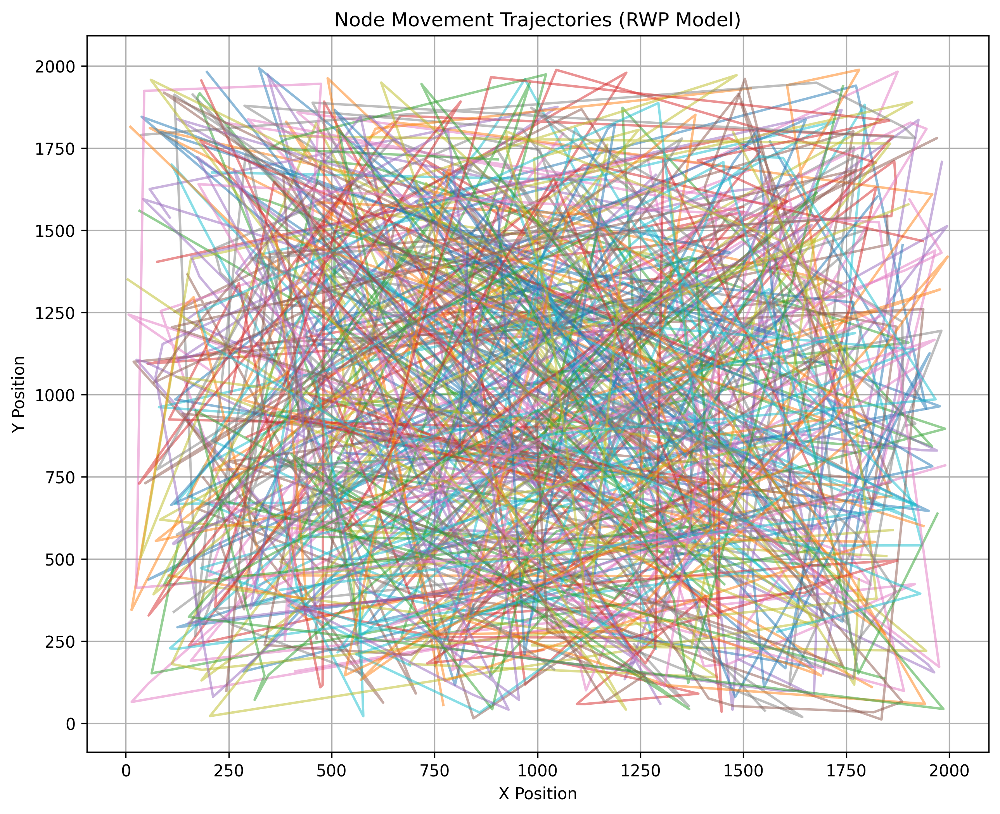

In [14]:
# Movment trajectories of the D2D_RWP median run

plt.figure(figsize=(10, 8), dpi=300)

# Plot mobility paths for all nodes
"""for node_id in df_mobility_rwp_long["node_id"].unique():
    node_movements = df_mobility_rwp_long[df_mobility_rwp_long["node_id"] == node_id]

    plt.plot(node_movements["x_position"], node_movements["y_position"], alpha=0.5)"""
# Plot each node's path
for node_id in df_mobility_rwp_long["node_id"].unique():
    node_movements = df_mobility_rwp_long[df_mobility_rwp_long["node_id"] == node_id]

    plt.plot(
        node_movements["x_position"].to_numpy(),
        node_movements["y_position"].to_numpy(),
        alpha=0.5
    )

plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Node Movement Trajectories (RWP Model)")
plt.grid(True)
plt.savefig("Plots/Node Movement Trajectories (RWP Model).pdf", format="pdf", bbox_inches="tight")
plt.show()


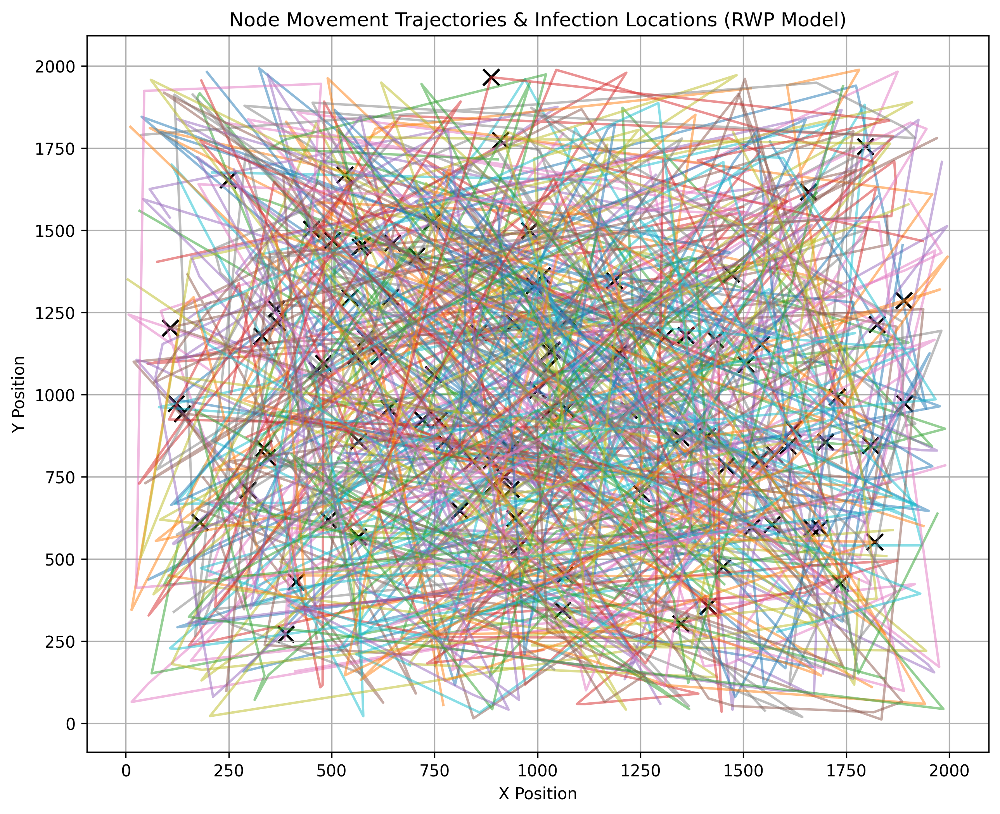

In [15]:
 # Plot Movement Trajectories of the D2D_RWP median run + Infection Locations

plt.figure(figsize=(10, 8), dpi=300)

# Plot mobility paths for all nodes
"""for node_id in df_mobility_rwp_long["node_id"].unique():
    node_movements = df_mobility_rwp_long[df_mobility_rwp_long["node_id"] == node_id]
    plt.plot(node_movements["x_position"], node_movements["y_position"], alpha=0.5, label=f"Node {node_id}" if node_id < 5 else None)  # Show labels for first few nodes only"""
for node_id in df_mobility_rwp_long["node_id"].unique():
    node_movements = df_mobility_rwp_long[df_mobility_rwp_long["node_id"] == node_id]
    plt.plot(
        node_movements["x_position"].to_numpy(),
        node_movements["y_position"].to_numpy(),
        alpha=0.5,
        label=f"Node {node_id}" if node_id < 0 else None  # optional: hide individual labels
    )

# Overlay infection locations
plt.scatter(df_infections_rwp["latitude"], df_infections_rwp["longitude"], color="black", marker="x", label="Infection Locations", s=100)

plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Node Movement Trajectories & Infection Locations (RWP Model)")
#plt.legend()
plt.grid(True)
plt.savefig("Plots/Node Movement Trajectories & Infection Locations (RWP Model).pdf", format="pdf", bbox_inches="tight")
plt.show()

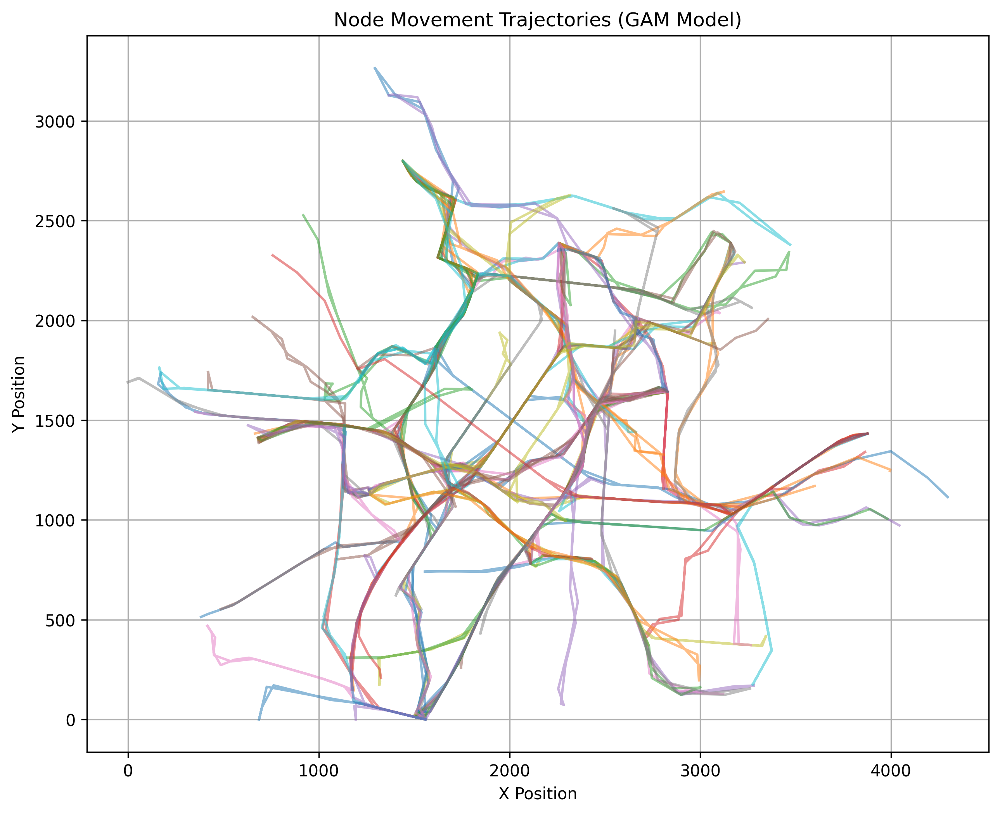

In [16]:
# Movment trajectories of the D2D_GAM median run

plt.figure(figsize=(10, 8), dpi=300)

# Plot mobility paths for all nodes
"""for node_id in df_mobility_gam_long["node_id"].unique():
    node_movements = df_mobility_gam_long[df_mobility_gam_long["node_id"] == node_id]

    plt.plot(node_movements["x_position"], node_movements["y_position"], alpha=0.5)"""

# Plot mobility paths for all nodes
for node_id in df_mobility_gam_long["node_id"].unique():
    node_movements = df_mobility_gam_long[df_mobility_gam_long["node_id"] == node_id]

    plt.plot(
        node_movements["x_position"].to_numpy(),
        node_movements["y_position"].to_numpy(),
        alpha=0.5
    )

plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Node Movement Trajectories (GAM Model)")
plt.grid(True)
plt.savefig("Plots/Node Movement Trajectories (GAM Model).pdf", format="pdf", bbox_inches="tight")
plt.show()


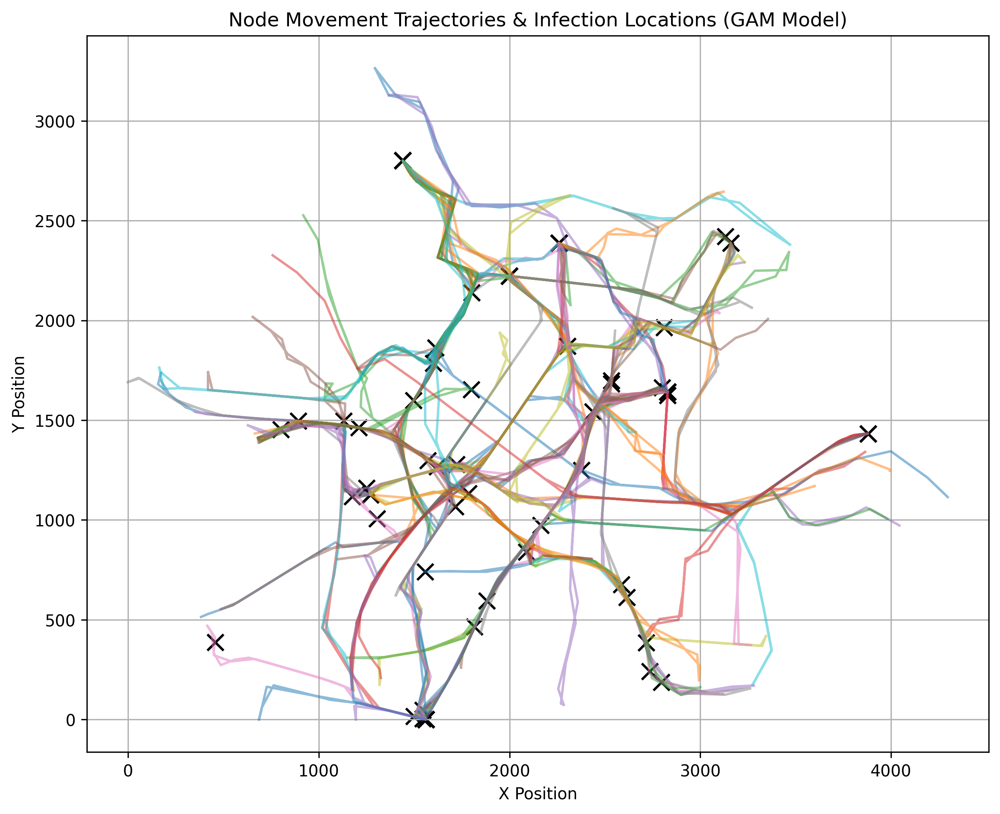

In [17]:
 # Plot Movement Trajectories of the D2D_GAM median run + Infection Locations


plt.figure(figsize=(10, 8), dpi=300)

# Plot mobility paths for all nodes
"""for node_id in df_mobility_gam_long["node_id"].unique():
    node_movements = df_mobility_gam_long[df_mobility_gam_long["node_id"] == node_id]
    plt.plot(node_movements["x_position"], node_movements["y_position"], alpha=0.5, label=f"Node {node_id}" if node_id < 5 else None)  # Show labels for first few nodes only"""
for node_id in df_mobility_gam_long["node_id"].unique():
    node_movements = df_mobility_gam_long[df_mobility_gam_long["node_id"] == node_id]
    plt.plot(
        node_movements["x_position"].to_numpy(),
        node_movements["y_position"].to_numpy(),
        alpha=0.5,
        label=f"Node {node_id}" if node_id < 0 else None  # optional: hide individual labels
    )

# Overlay infection locations
plt.scatter(df_infections_gam["latitude"], df_infections_gam["longitude"], color="black", marker="x", label="Infection Locations", s=100)

plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Node Movement Trajectories & Infection Locations (GAM Model)")
#plt.legend()
plt.grid(True)
plt.savefig("Plots/Node Movement Trajectories & Infection Locations (GAM Model).pdf", format="pdf", bbox_inches="tight")
plt.show()


In [18]:
# Extract Infection Chains for Each Median Run
def extract_infection_layers(df_infections_median):
    """ Build a layered infection chain {layer: [nodes]} and print each layer's nodes """
    infection_layers = {0: [0, 1, 2, 3, 4]}  # Manually set initial infections
    print(f"Layer 0: {infection_layers[0]}")  # Print initial infections

    # Find infected nodes layer by layer
    current_layer = 0
    while True:
        next_layer_nodes = df_infections_median[df_infections_median["infected_by"].isin(infection_layers[current_layer])]["node_id"].tolist()
        
        if not next_layer_nodes:  # Stop if no more nodes are infected
            break
        
        current_layer += 1
        infection_layers[current_layer] = next_layer_nodes  # Store next infection wave
        print(f"Layer {current_layer}: {next_layer_nodes}")  # Print each layer's nodes
    
    return infection_layers

# Extract infection layers for the median run of each model
infection_layers_rwp = extract_infection_layers(df_infections_rwp)
infection_layers_gam = extract_infection_layers(df_infections_gam)




Layer 0: [0, 1, 2, 3, 4]
Layer 1: [9, 22, 88, 20, 95, 29, 60, 17, 64, 70, 46, 50, 82, 39, 8, 7]
Layer 2: [34, 91, 42, 83, 74, 38, 51, 67, 21, 97, 93, 15, 31, 43, 52, 62, 12, 84, 27, 14, 53, 54, 76, 58, 32]
Layer 3: [30, 19, 78, 55, 65, 72, 71, 11, 41, 69, 33, 90, 85, 24, 66, 25, 63, 16, 49, 68, 96, 89, 92, 57, 36, 59, 45]
Layer 4: [81, 5, 79, 37, 6, 48, 13, 86, 44, 73, 10, 75, 28, 87, 98, 77, 56, 61, 18, 94, 23, 26]
Layer 5: [99, 80, 47, 35]
Layer 6: [40]
Layer 0: [0, 1, 2, 3, 4]
Layer 1: [6, 94, 46, 87, 15, 65, 61, 19, 39, 37, 69, 49, 17, 33, 26, 62]
Layer 2: [27, 5, 38, 57, 45, 25, 91, 29, 76, 28, 58, 74, 88, 32, 80, 11, 73, 81, 96, 89, 66, 77, 16, 83, 68, 64, 92, 35, 51, 9, 71, 7, 56, 75, 8]
Layer 3: [30, 23, 14, 53, 70, 86, 43, 84, 18, 22, 67, 41, 24, 47, 90, 13, 20, 40, 98, 42, 31, 99, 54, 97, 44, 82, 59]
Layer 4: [52, 79, 10, 50, 34, 95, 55, 48, 93, 21, 63, 85, 78, 60]
Layer 5: [72, 36, 12]


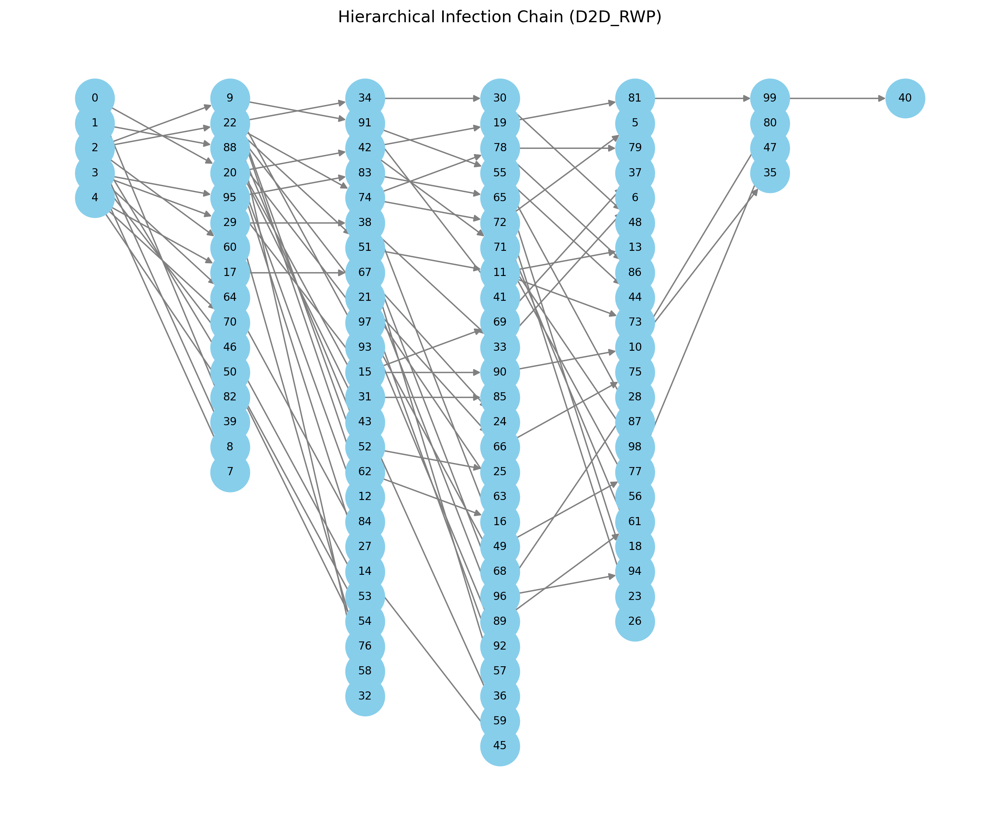

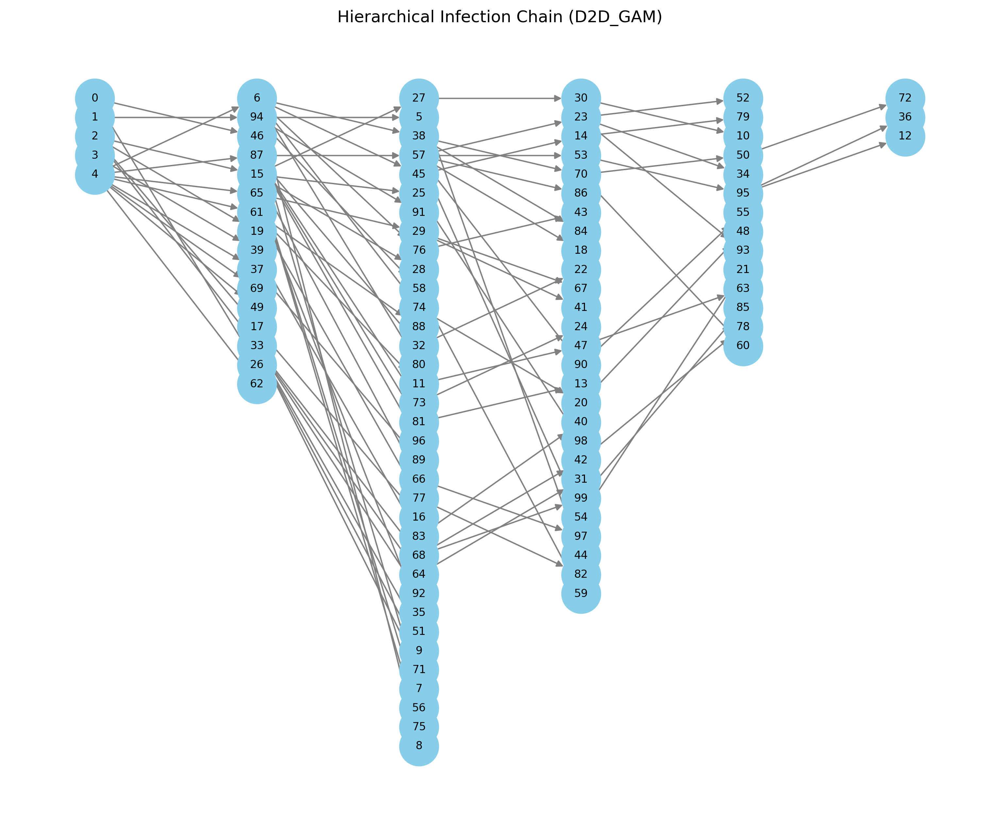

In [19]:
#Plot Hierarchical Infection Chains 
import networkx as nx

def plot_infection_hierarchy(infection_layers, df_infections, title):
    """ Plot a hierarchical infection chain where each layer is shown as a vertical line """
    G = nx.DiGraph()

    # Add nodes and edges
    pos = {}  # Dictionary to store node positions for visualization
    x_spacing = 3  # Horizontal spacing between layers
    y_spacing = 1  # Vertical spacing between nodes in the same layer

    for layer, nodes in infection_layers.items():
        for i, node in enumerate(nodes):
            pos[node] = (layer * x_spacing, -i * y_spacing)  # Arrange in vertical hierarchy
            G.add_node(node, layer=layer)

            # Add edges from previous layer
            if layer > 0:
                parent_nodes = infection_layers[layer - 1]  # Get previous layer nodes
                infected_by_parents = df_infections[df_infections["node_id"] == node]["infected_by"].values
                
                for parent in infected_by_parents:
                    if parent in parent_nodes:  # Ensure only valid connections
                        G.add_edge(parent, node)

    # Draw the graph
    plt.figure(figsize=(10, 8), dpi=300)
    nx.draw(G, pos, with_labels=True, node_size=800, node_color='skyblue', edge_color='gray', linewidths=1, font_size=8)
    plt.title(title)
    plt.xlabel("Infection Layers")
    plt.ylabel("Nodes (Vertical Position is Arbitrary)")
    plt.grid(False)
    plt.savefig("Plots/"+title+".pdf", format="pdf", bbox_inches="tight")
    plt.show()

# Generate the plots for each model using the correct dataframe
plot_infection_hierarchy(infection_layers_rwp, df_infections_rwp, "Hierarchical Infection Chain (D2D_RWP)")
plot_infection_hierarchy(infection_layers_gam, df_infections_gam, "Hierarchical Infection Chain (D2D_GAM)")



A boxplot (also called a whisker plot) summarizes the distribution of infection times for each model using key statistical measures:

    The Box (Interquartile Range - IQR)
        The bottom of the box is Q1 (25th percentile) → 25% of nodes were infected before this time.
        The top of the box is Q3 (75th percentile) → 75% of nodes were infected before this time.
        The box represents the middle 50% of infection times.

The Line Inside the Box (Median)

    The horizontal line inside the box shows the median (Q2 - 50th percentile) infection time.
    This is the middle value of the infection times for each model.

The Whiskers (Min & Max, Excluding Outliers)

    The whiskers extend to the smallest and largest infection times within 1.5 × IQR from Q1 and Q3.
    Whiskers capture most data points unless there are extreme outliers.

Outliers (Dots)

    Any points outside the whiskers are considered outliers.
    These represent nodes that got infected significantly earlier or later than the majority.

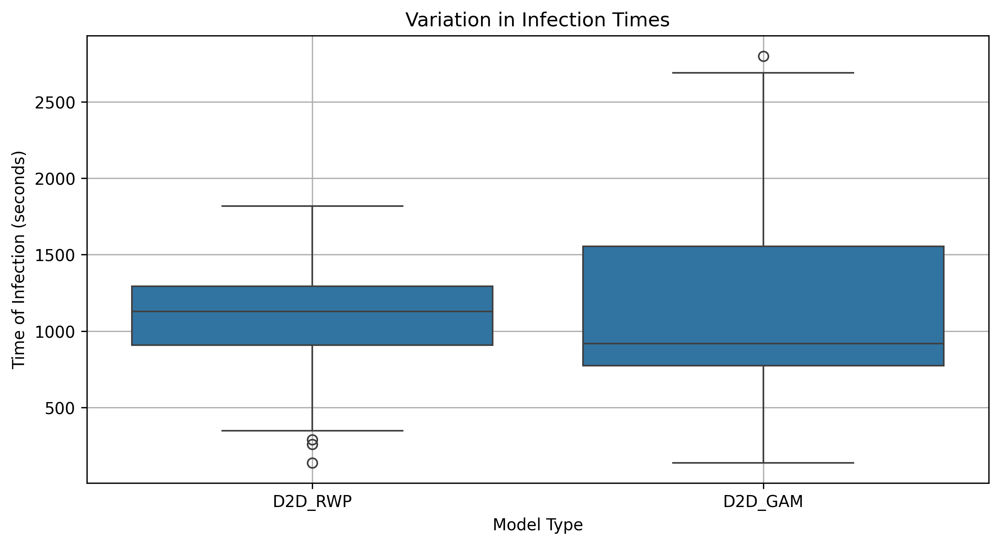

In [20]:
# Infection Time Spread (Boxplot) Variability in infection times across different runs.

plt.figure(figsize=(10,5), dpi=300)

df = pd.concat([df_infections_rwp, df_infections_gam], ignore_index=True)

sns.boxplot(data=df, x="model", y="malware_active_time")

plt.xlabel("Model Type")
plt.ylabel("Time of Infection (seconds)")
plt.title("Variation in Infection Times")
plt.grid(True)
plt.savefig("Plots/Variation in Infection Times.pdf", format="pdf", bbox_inches="tight")
plt.show()


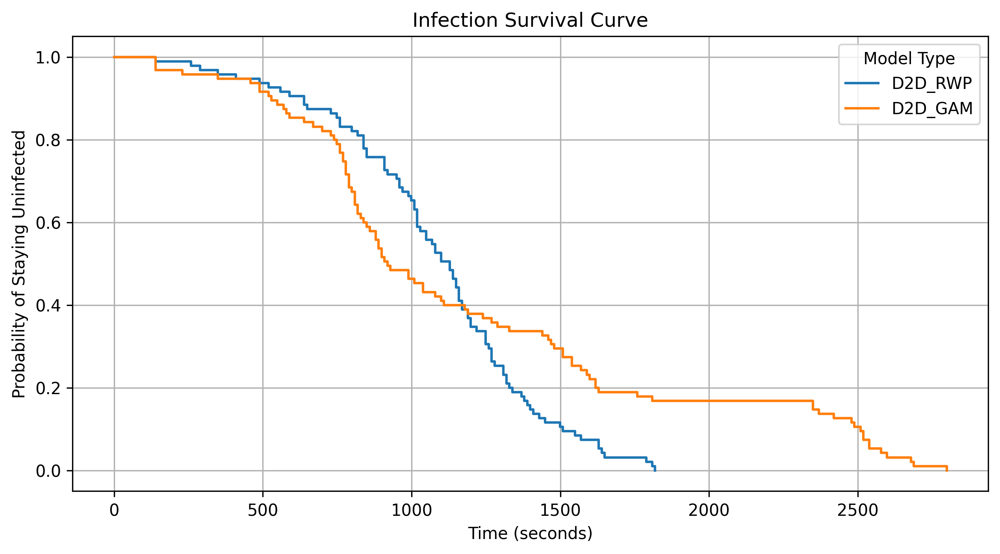

In [21]:
from lifelines import KaplanMeierFitter

# Initialize figure
plt.figure(figsize=(10, 5), dpi=300)

kmf = KaplanMeierFitter()

# Fit and plot survival curve for each model
for model, model_df in zip(["D2D_RWP", "D2D_GAM"], [df_infections_rwp, df_infections_gam]):
    # Fit Kaplan-Meier survival function (time until infection)
    kmf.fit(durations=model_df["malware_active_time"], event_observed=np.ones(len(model_df)))
    
    # Plot survival curve
    kmf.plot_survival_function(ci_show=False,label=model) # can set confidence intervals 

# Labels and formatting
plt.xlabel("Time (seconds)")
plt.ylabel("Probability of Staying Uninfected")
plt.title("Infection Survival Curve")
plt.legend(title="Model Type")
plt.grid(True)
plt.savefig("Plots/Infection Survival Curve (without confidence interval).pdf", format="pdf", bbox_inches="tight")
plt.show()

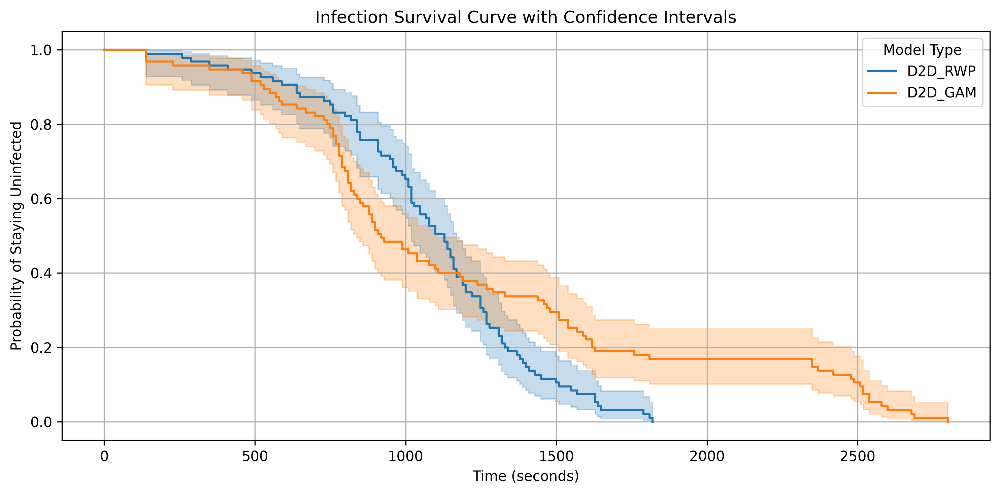

In [23]:
from lifelines import KaplanMeierFitter

plt.figure(figsize=(10, 5), dpi=300)

kmf = KaplanMeierFitter()

# Fit and plot survival curve for each model
for model, model_df in zip(["D2D_RWP", "D2D_GAM"], [df_infections_rwp, df_infections_gam]):
    kmf.fit(durations=model_df["malware_active_time"], event_observed=np.ones(len(model_df)))
    kmf.plot_survival_function(label=model)  # ci_show=True is default

plt.xlabel("Time (seconds)")
plt.ylabel("Probability of Staying Uninfected")
plt.title("Infection Survival Curve with Confidence Intervals")
plt.legend(title="Model Type")
plt.grid(True)
plt.tight_layout()
plt.savefig("Plots/Infection Survival Curve (with confidence interval)", format="pdf", bbox_inches="tight")
plt.show()
